In [1]:
import numpy as np
import matplotlib.pyplot as plt
# %matplotlib widget
%matplotlib inline
from skimage import io, color, util
from skimage import segmentation as seg
from skimage.future import graph
from skimage import exposure
from skimage import transform as trans

In [2]:
# path_to_pics = r'D:\SENYA\ml\data_sets\Oil_from_mat'
path_to_pics = r'D:\SENYA\ml\data_sets\Oil_expanded'

import os
pics_names = os.listdir(path_to_pics)
pics = [path_to_pics + '\\' + i for i in pics_names]

## Генерация данных (среднее суперпикселей)

In [65]:
def get_sup_pixs_avg(img, mask):
    num_of_segments = len(np.unique(mask))
    avg_list = np.empty((num_of_segments, 3))  # Массив средних тонов изображения
    
    for id, tone in enumerate(range(1, num_of_segments + 1)): 
        segment_mask = mask == tone                       # Создание маски суперпикселя (сегмента)
        avg_tone = img[segment_mask].mean(axis=0).round() # Получение среднего тона сегмента с помощью маски 
        avg_list[id] = avg_tone

    avg_list = avg_list.astype(np.uint8)
    return avg_list

Предобратка с увеличением контрастности и изменеием размера

In [64]:
def preproc_img(img, range=2):
    h, w = img.shape[0], img.shape[1]
    k = (1000000 / (w*h)) ** (0.5)
    h, w = h * k, w * k
    img = util.img_as_ubyte(trans.resize(img, (h, w, 3)))
    p_low, p_high = np.percentile(img, (range, 100-range))
    result = exposure.rescale_intensity(img, in_range=(p_low, p_high))
    return result

Тест предобработки

'shh'

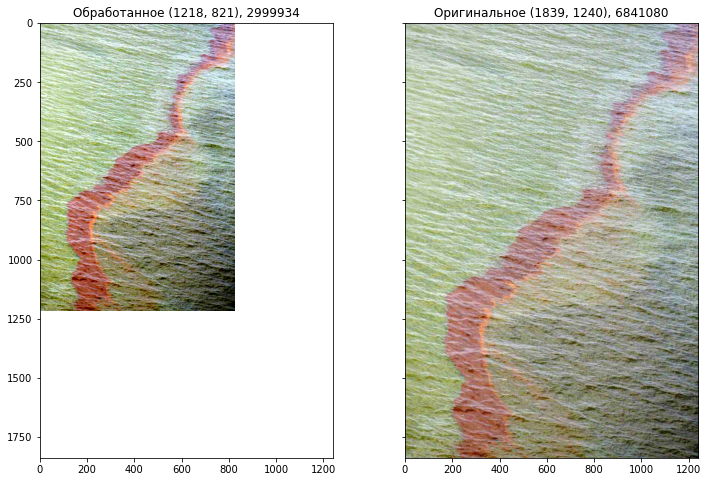

In [27]:
fig, ax = plt.subplots(1, 2, sharey=True, sharex=True, figsize=(12, 8))
img = io.imread(pics[4])
orig = img.copy()
img = preproc_img(img, 1)
ax[0].imshow(img)
ax[0].set_title(f'Обработанное {img.shape[:2]}, {img.size}')
ax[1].imshow(orig)
ax[1].set_title(f'Оригинальное {orig.shape[:2]}, {orig.size}')
'shh'

Объединение сегментов

In [62]:
def merge_segments(img, sliced, thr):
    def _weight_mean_color(graph, src, dst, n):
        diff = graph.nodes[dst]['mean color'] - graph.nodes[n]['mean color']
        diff = np.linalg.norm(diff)
        return {'weight': diff}
    def merge_mean_color(graph, src, dst):
        graph.nodes[dst]['total color'] += graph.nodes[src]['total color']
        graph.nodes[dst]['pixel count'] += graph.nodes[src]['pixel count']
        graph.nodes[dst]['mean color'] = (graph.nodes[dst]['total color'] /
                                        graph.nodes[dst]['pixel count'])
                                        
    rag_g = graph.rag_mean_color(img, sliced)
    merged = graph.merge_hierarchical(sliced, rag_g, thresh=thr, rag_copy=False,
                                    in_place_merge=True,
                                    merge_func=merge_mean_color,
                                    weight_func=_weight_mean_color)
    return merged + 1

Основной цикл

In [63]:
sigma = 2
n_segments = 100
thr=20 # Обычно было 30

In [66]:
pics_avg_tones = []

for id, path in enumerate(pics):
    img = io.imread(path)
    img = preproc_img(img)
    slic_edge = seg.slic(img, n_segments, sigma=sigma)
    merged = merge_segments(img, slic_edge, thr)
    
    avg_tones = get_sup_pixs_avg(img.copy(), merged) # Получение средних тонов суперпикселей
    pics_avg_tones.append(avg_tones)

#### Рагга

In [31]:
def _weight_mean_color(graph, src, dst, n):
    diff = graph.nodes[dst]['mean color'] - graph.nodes[n]['mean color']
    diff = np.linalg.norm(diff)
    return {'weight': diff}


def merge_mean_color(graph, src, dst):
    graph.nodes[dst]['total color'] += graph.nodes[src]['total color']
    graph.nodes[dst]['pixel count'] += graph.nodes[src]['pixel count']
    graph.nodes[dst]['mean color'] = (graph.nodes[dst]['total color'] /
                                      graph.nodes[dst]['pixel count'])

In [44]:
img = io.imread(pics[8])
img = preproc_img(img)
sliced = seg.slic(img, 100, sigma=2, start_label=0)

rag_g = graph.rag_mean_color(img, sliced)

merged = graph.merge_hierarchical(sliced, rag_g, thresh=thr, rag_copy=False,
                            in_place_merge=True,
                            merge_func=merge_mean_color,
                            weight_func=_weight_mean_color)
np.unique(merged)

(array([ 3,  7, 10, 17, 27, 37, 52, 64, 80, 83, 87]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64))

Text(0.5, 0.98, 'rag thresh=30')

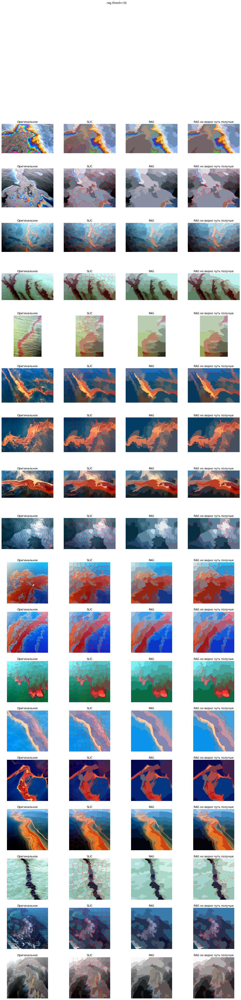

In [40]:
rows = len(pics)
fig, ax = plt.subplots(rows, 4, figsize=(19, rows * 4))
thr = 30

for id, path in enumerate(pics):
    img = io.imread(pics[id])
    img = preproc_img(img)
    sliced = seg.slic(img, 100, sigma=2, start_label=0)
    
    rag_g = graph.rag_mean_color(img, sliced)

    merged = graph.merge_hierarchical(sliced, rag_g, thresh=thr, rag_copy=False,
                                    in_place_merge=True,
                                    merge_func=merge_mean_color,
                                    weight_func=_weight_mean_color)

    ragga = color.label2rgb(merged, img, kind='avg', bg_label=None)
    marked_ragga = seg.mark_boundaries(ragga, merged, color=[1, 0, 0])

    sliced_show = seg.mark_boundaries(color.label2rgb(sliced, img, 
                                                    kind='avg', bg_label=None),
                                      sliced, color=[1, 0, 0])

    ax[id, 0].imshow(img)
    ax[id, 0].axis('off')
    ax[id, 0].set_title('Оригинальное')
    ax[id, 1].imshow(sliced_show)
    ax[id, 1].axis('off')
    ax[id, 1].set_title('SLIC')
    ax[id, 2].imshow(ragga)
    ax[id, 2].axis('off')
    ax[id, 2].set_title('RAG')
    ax[id, 3].imshow(marked_ragga)
    ax[id, 3].axis('off')
    ax[id, 3].set_title('RAG но видно чуть получше')
fig.suptitle(f'rag thresh={thr}')

## Структурирование данных

In [43]:
import pandas as pd

In [67]:
df = pd.DataFrame(pics_avg_tones).explode(0)
df[['R', 'G', 'B']] = df.loc[:,0].apply(pd.Series)
df = df.drop(columns=[0])
df = df.reset_index().rename(columns={'index':'Picture'})
df['Segment'] = df.groupby('Picture').cumcount() + 1
df = df.set_index(['Picture', 'Segment'])
df

D:\Anacondec\envs\Diplom\lib\site-packages\pandas\core\internals\construction.py:576: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  values = np.array([convert(v) for v in values])


R    G    B
Picture Segment               
0       1        132  150  178
        2        163  187  222
        3        221  219  202
        4        137  101  114
        5        243  225  167
...              ...  ...  ...
17      41        78   97  115
        42        82   76   80
        43         6    6    6
        44       118  109  100
        45         2    3    3

[765 rows x 3 columns]

In [68]:
df.to_csv(r'D:\SENYA\ml\data_sets\rag\rag20_new_pics_rgb.csv')

### Перевод в другие цветовые пространства

In [69]:
converted = pd.DataFrame(util.img_as_ubyte(color.rgb2hsv(df.values)), index=df.index, columns=['H', 'S', 'V'])
converted

H   S    V
Picture Segment              
0       1        153  66  178
        2        153  68  222
        3         38  22  221
        4        240  67  137
        5         32  80  243
...              ...  ..  ...
17      41       148  82  115
        42       227  19   82
        43         0   0    6
        44        21  39  118
        45       128  85    3

[765 rows x 3 columns]

In [71]:
converted = pd.DataFrame(color.rgb2lab(df.values), index=df.index, columns=['L', 'A', 'B'])
converted

L          A          B
Picture Segment                                 
0       1        61.595175   0.023623 -16.704045
        2        75.201458  -0.390732 -20.199692
        3        87.143756  -2.249483   8.603867
        4        46.765673  16.628651  -1.598408
        5        89.718606  -2.302914  30.666758
...                    ...        ...        ...
17      41       40.256734  -2.497353 -12.492160
        42       33.010174   3.320373  -1.467587
        43        1.645041  -0.000104   0.000198
        44       46.590646   1.846271   6.295156
        45        0.764212  -0.261552  -0.092040

[765 rows x 3 columns]

In [72]:
converted.to_csv(r'D:\SENYA\ml\data_sets\rag\rag20_new_pics_lab.csv')

## Проверка результата

In [68]:
# df = pd.read_csv(r'D:\SENYA\ml\data_sets\avg_rgb_on_matlab_pics.csv', index_col=(0, 1))

sigma = 3  
n_segments = 150  
в файле avg_rgb_on_matlab_sigma3_nseg150.csv

In [50]:
sigma = 2
n_segments = 100
thr=20

Проверка только для SLIC

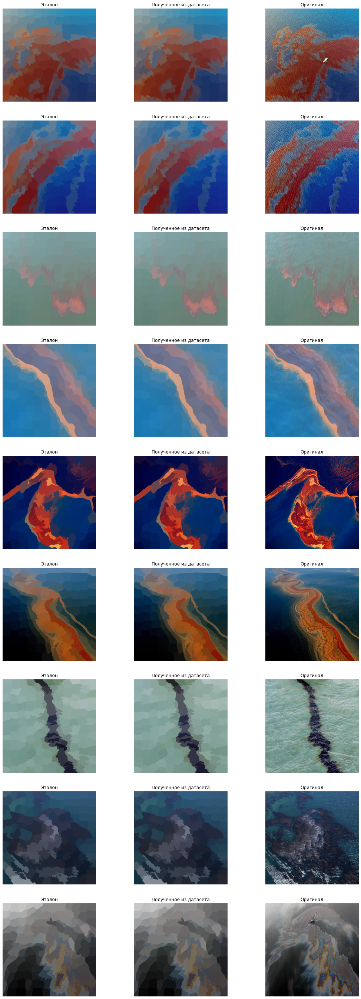

In [70]:
fig, ax = plt.subplots(9, 3, figsize=(18, 49))

for id in range(len(pics)):
    img = io.imread(pics[id])
    img_slic = seg.slic(img, n_segments, sigma=sigma)
    img_meta = df.loc[id]
    avg_tones_from_df = img.copy()
    for tone in np.unique(img_slic):
        mask = img_slic == tone
        avg_tones_from_df[mask] = img_meta.loc[tone].values

    ax[id][0].imshow(color.label2rgb(img_slic, img, kind='avg'))
    ax[id][0].axis('off')
    ax[id][0].set_title('Эталон')
    ax[id][1].imshow(avg_tones_from_df)
    ax[id][1].axis('off')
    ax[id][1].set_title('Полученное из датасета')
    ax[id][2].imshow(img)
    ax[id][2].axis('off')
    ax[id][2].set_title('Оригинал')

Проверка SLIC + RAG

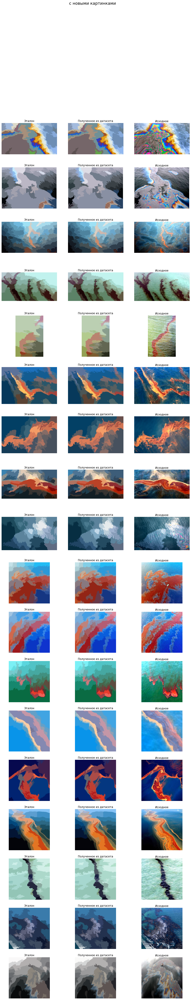

In [54]:
rows = len(pics)
fig, ax = plt.subplots(rows, 3, figsize=(15, rows * 4))

for id in range(len(pics)):
    img = io.imread(pics[id])
    img = preproc_img(img)
    img_slic = seg.slic(img, n_segments, sigma=sigma)
    img_slic = merge_segments(img, img_slic, thr)
    img_meta = df.loc[id]        # для ргб
    # img_meta = converted.loc[id]
    avg_tones_from_df = img.copy()
    for tone in np.unique(img_slic):
        mask = img_slic == tone
        avg_tones_from_df[mask] = img_meta.loc[tone].values   # для ргб
        # avg_tones_from_df[mask] = util.img_as_ubyte(            # для конвертированного
        #                                             color.lab2rgb(img_meta.loc[tone].values)
        #                                             )

    ax[id][0].imshow(color.label2rgb(img_slic, img, kind='avg'))
    ax[id][0].axis('off')
    ax[id][0].set_title('Эталон')
    ax[id][1].imshow(avg_tones_from_df)
    ax[id][1].axis('off')
    ax[id][1].set_title('Полученное из датасета')
    ax[id][2].imshow(img)
    ax[id][2].axis('off')
    ax[id][2].set_title('Исходное')
    # fig.suptitle('С применением RAG thresh=30', fontsize=18)
    fig.suptitle('с новыми картинками', fontsize=18)